# Financial Well-Being Project: Data Analysis

Survey was administered by the Consumer Financial Protection Bureau (CFPB)

In [1]:
# Import dependencies
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import tree
from sklearn.metrics import mean_squared_error, r2_score, confusion_matrix, accuracy_score, classification_report

## Load Preprocessed Data

In [2]:
# Set path for CSV file
path = Path('data/fwb_processed_data.csv')
# path = Path('resources/NFWBS_PUF_2016_data.csv')

# Load preprocessed data
data_df = pd.read_csv(path, index_col=0)

# Display shape and sample data
print(f'Dataframe shape: {data_df.shape}')
data_df.head()

Dataframe shape: (6097, 54)


,PPEDUC,agecat,HEALTH,PPETHM,PPGENDER,PPMARIT,PPREG4,HOUSING,HOUSESAT,KIDS_1,...,PROPPLAN_4,MANAGE1_1,MANAGE1_2,MANAGE1_3,MANAGE1_4,SAVEHABIT,GOALCONF,SCFHORIZON,FWBscore,FWBscore_wt
PUF_ID,,,,,,,,,,,,,,,,,,,,,
10350,4,8,2,1,1,3,4,1,4,0,...,3,4,4,2,4,4,3,3,55,20.201053
7740,2,3,3,1,1,3,2,1,3,0,...,1,4,4,1,4,1,3,3,51,67.705596
13699,3,3,3,2,1,3,4,1,3,0,...,4,3,3,3,3,5,3,4,49,40.922635
7375,2,2,3,3,1,1,2,2,3,0,...,3,3,3,3,3,4,3,3,49,208.772739
10910,4,2,5,1,1,1,2,1,4,0,...,4,5,3,5,5,4,4,1,67,50.924079


## Model Definitions and Functions

In [3]:
# Define features set
X = data_df.copy()
X.drop(columns=['FWBscore', 'FWBscore_wt'], axis=1, inplace=True)
X.head()

,PPEDUC,agecat,HEALTH,PPETHM,PPGENDER,PPMARIT,PPREG4,HOUSING,HOUSESAT,KIDS_1,...,PROPPLAN_2,PROPPLAN_3,PROPPLAN_4,MANAGE1_1,MANAGE1_2,MANAGE1_3,MANAGE1_4,SAVEHABIT,GOALCONF,SCFHORIZON
PUF_ID,,,,,,,,,,,,,,,,,,,,,
10350,4,8,2,1,1,3,4,1,4,0,...,4,4,3,4,4,2,4,4,3,3
7740,2,3,3,1,1,3,2,1,3,0,...,2,2,1,4,4,1,4,1,3,3
13699,3,3,3,2,1,3,4,1,3,0,...,4,4,4,3,3,3,3,5,3,4
7375,2,2,3,3,1,1,2,2,3,0,...,3,3,3,3,3,3,3,4,3,3
10910,4,2,5,1,1,1,2,1,4,0,...,4,3,4,5,3,5,5,4,4,1


In [63]:
# Define target
y = data_df['FWBscore'].values.reshape(-1, 1)
y[:5]

array([[55],
       [51],
       [49],
       [49],
       [67]], dtype=int64)

In [5]:
def eval_model_cmcr():
    # Calculating the confusion matrix
    index = ['Actual ' + label for label in class_labels]
    columns = ['Predicted ' + label for label in class_labels]

    cm = confusion_matrix(y_test, predictions)
    cm_df = pd.DataFrame(
        cm, index=index,
        columns=columns
    )

    # Calculating the accuracy score
    acc_score = accuracy_score(y_test, predictions)
    
    # Displaying results
    print("Confusion Matrix")
    display(cm_df)
    print(f"Accuracy Score : {acc_score}")
    print("Classification Report")
    print(classification_report(y_test, predictions))

In [68]:
def get_class_labels(num, labels):
    y = pd.qcut(data_df['FWBscore'], num, labels=labels)
    y = y.values.reshape(-1, 1)
    y[:5]
    return y

## Linear Regression Model

In [64]:
# Create a model with scikit-learn
model_lr = LinearRegression()

### Fit the model and make predictions

In [65]:
# Fit the data into the model
model_lr.fit(X, y)

LinearRegression()

In [66]:
# Make predictions using the X set
predicted_y_values = model_lr.predict(X)

# Create a copy of the original data
predicted_df = data_df.copy()

# Add a column with the predicted salary values
predicted_df["predicted_FWBscore"] = predicted_y_values

# Display sample data
predicted_df

,PPEDUC,agecat,HEALTH,PPETHM,PPGENDER,PPMARIT,PPREG4,HOUSING,HOUSESAT,KIDS_1,...,MANAGE1_1,MANAGE1_2,MANAGE1_3,MANAGE1_4,SAVEHABIT,GOALCONF,SCFHORIZON,FWBscore,FWBscore_wt,predicted_FWBscore
PUF_ID,,,,,,,,,,,,,,,,,,,,,
10350,4,8,2,1,1,3,4,1,4,0,...,4,4,2,4,4,3,3,55,20.201053,53.653166
7740,2,3,3,1,1,3,2,1,3,0,...,4,4,1,4,1,3,3,51,67.705596,43.510003
13699,3,3,3,2,1,3,4,1,3,0,...,3,3,3,3,5,3,4,49,40.922635,55.651330
7375,2,2,3,3,1,1,2,2,3,0,...,3,3,3,3,4,3,3,49,208.772739,46.119042
10910,4,2,5,1,1,1,2,1,4,0,...,5,3,5,5,4,4,1,67,50.924079,59.080755
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11220,5,7,5,2,2,1,2,1,4,0,...,5,3,3,4,4,3,3,61,31.872719,56.964619
13118,2,6,4,2,1,1,3,1,4,1,...,4,4,3,5,4,3,1,59,59.897899,55.626728
8709,5,2,3,1,2,1,1,2,3,0,...,5,5,5,4,5,3,5,59,67.039953,58.987951


### Evaluate the model

In [67]:
# Compute metrics for the linear regression model: score, r2, mse, rmse, std
score = model_lr.score(X, y, sample_weight=None)
r2 = r2_score(y, predicted_y_values)
mse = mean_squared_error(y, predicted_y_values)
rmse = np.sqrt(mse)
std = np.std(y)

# Print relevant metrics.
print(f"The score is {score}.")
print(f"The r2 is {r2}.")
print(f"The mean squared error is {mse}.")
print(f"The root mean squared error is {rmse}.")
print(f"The standard deviation is {std}.")

The score is 0.6499958331411073.
The r2 is 0.6499958331411073.
The mean squared error is 69.10000097116277.
The root mean squared error is 8.312641034662978.
The standard deviation is 14.0508442373654.


## Decision Tree with 3 Classes

### Setup and scale data

In [87]:
# Display quartiles for cutting
data_df['FWBscore'].quantile([.25, .5, .75])

0.25    48.0
0.50    56.0
0.75    65.0
Name: FWBscore, dtype: float64

In [106]:
# Create 2 target classes
num_classes = 2
class_labels = ['Bad', 'Good']
y = pd.qcut(data_df['FWBscore'], num_classes, labels=class_labels)
y = y.values.reshape(-1, 1)

In [ ]:
# Create 3 target classes
num_classes = 3
class_labels = ['<Avg', 'Avg', '>Avg']
y = pd.qcut(data_df['FWBscore'], num_classes, labels=class_labels)
y = y.values.reshape(-1, 1)
y[:5]

In [107]:
# Splitting into Train and Test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=78)

# Creating StandardScaler instance
scaler = StandardScaler()

# Fitting Standard Scaller
X_scaler = scaler.fit(X_train)

# Scaling data
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

### Determine the best set of hyperparameters

In [131]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier 

In [153]:
parameters = {'max_depth': (3, 5, 7, 9, 10, 20, 50),
              'criterion': ('gini', 'entropy'),
              'max_features': ('sqrt', 'log2', None),
              'min_samples_split': (2, 4, 6, 10, 20, 30),
              'min_samples_leaf': (1, 2, 5, 8) 
             }

In [160]:
# Create the decision tree classifier instance
model_dt = RandomizedSearchCV(DecisionTreeClassifier(),param_distributions = parameters, cv = 30, verbose = True)

In [161]:
# Fit the model
model_dt = model_dt.fit(X_train, y_train)

Fitting 30 folds for each of 10 candidates, totalling 300 fits


In [162]:
model_dt.best_estimator_

DecisionTreeClassifier(max_depth=9, min_samples_leaf=5, min_samples_split=4)

### Fit, Predict and Evaluate Model

In [164]:
# Create list to store decision tree classifier instances
model_dt2c = []

# DT Model #1: Default settings
model_dt2c.append(DecisionTreeClassifier(max_depth=None, max_features=None, min_samples_split=2, min_samples_leaf=1))

# DT Model #1: Simpler tree
model_dt2c.append(DecisionTreeClassifier(max_depth=3, max_features=None, min_samples_split=5, min_samples_leaf=3))  

# DT Model #3: Best results after testing
model_dt2c.append(DecisionTreeClassifier(max_depth=5, max_features=None, min_samples_split=10, min_samples_leaf=5))                 
                  
# DT Model #4: First best estimator from RandomizedSearchCV
model_dt2c.append(DecisionTreeClassifier(max_depth=5, max_features=None, min_samples_split=2, min_samples_leaf=2))

# DT Model #5: Another best estimator from RandomizedSearchCV
model_dt2c.append(DecisionTreeClassifier(max_depth=9, max_features=None, min_samples_split=5, min_samples_leaf=4))

In [165]:
for i in range(0, len(model_dt2c)):
    model = model_dt2c[i]           
               
    # Fit the model
    model = model.fit(X_train_scaled, y_train)

    # Make predictions using the testing data
    predictions = model.predict(X_test_scaled)
    
    # Evaluate the model
    print(f'Evaluating model #{i+1}\n')
    eval_model_cmcr()

Evaluating model #1

Confusion Matrix


,Predicted Bad,Predicted Good
Actual Bad,627,171
Actual Good,169,558


Accuracy Score : 0.7770491803278688
Classification Report
              precision    recall  f1-score   support

         Bad       0.79      0.79      0.79       798
        Good       0.77      0.77      0.77       727

    accuracy                           0.78      1525
   macro avg       0.78      0.78      0.78      1525
weighted avg       0.78      0.78      0.78      1525

Evaluating model #2

Confusion Matrix


,Predicted Bad,Predicted Good
Actual Bad,633,165
Actual Good,92,635


Accuracy Score : 0.8314754098360656
Classification Report
              precision    recall  f1-score   support

         Bad       0.87      0.79      0.83       798
        Good       0.79      0.87      0.83       727

    accuracy                           0.83      1525
   macro avg       0.83      0.83      0.83      1525
weighted avg       0.84      0.83      0.83      1525

Evaluating model #3

Confusion Matrix


,Predicted Bad,Predicted Good
Actual Bad,666,132
Actual Good,106,621


Accuracy Score : 0.8439344262295082
Classification Report
              precision    recall  f1-score   support

         Bad       0.86      0.83      0.85       798
        Good       0.82      0.85      0.84       727

    accuracy                           0.84      1525
   macro avg       0.84      0.84      0.84      1525
weighted avg       0.84      0.84      0.84      1525

Evaluating model #4

Confusion Matrix


,Predicted Bad,Predicted Good
Actual Bad,661,137
Actual Good,109,618


Accuracy Score : 0.838688524590164
Classification Report
              precision    recall  f1-score   support

         Bad       0.86      0.83      0.84       798
        Good       0.82      0.85      0.83       727

    accuracy                           0.84      1525
   macro avg       0.84      0.84      0.84      1525
weighted avg       0.84      0.84      0.84      1525

Evaluating model #5

Confusion Matrix


,Predicted Bad,Predicted Good
Actual Bad,619,179
Actual Good,101,626


Accuracy Score : 0.8163934426229508
Classification Report
              precision    recall  f1-score   support

         Bad       0.86      0.78      0.82       798
        Good       0.78      0.86      0.82       727

    accuracy                           0.82      1525
   macro avg       0.82      0.82      0.82      1525
weighted avg       0.82      0.82      0.82      1525



### Plot and Save Decision Tree

In [166]:
feature_names = list(X.columns)

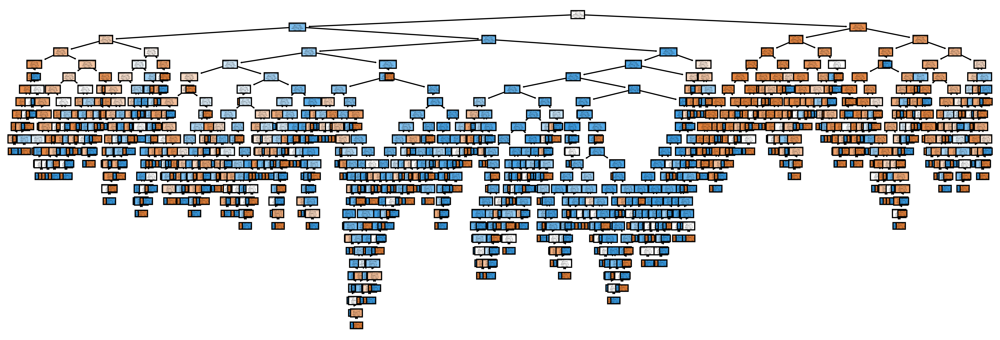

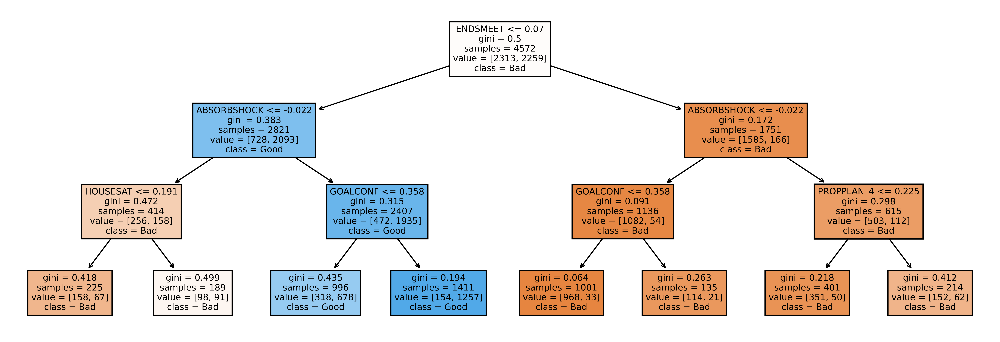

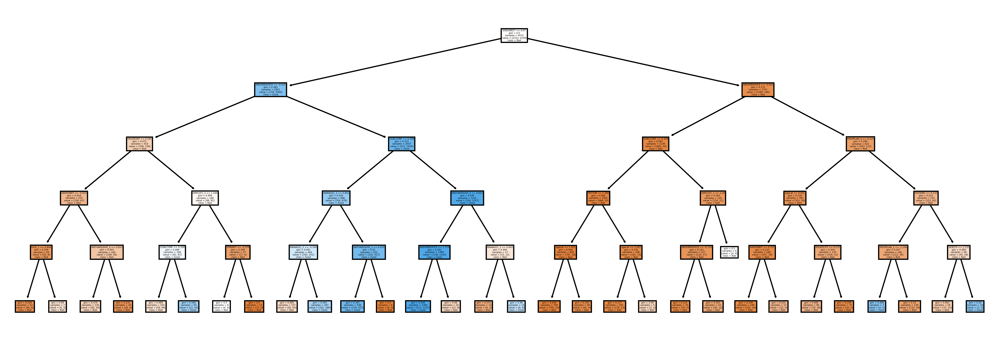

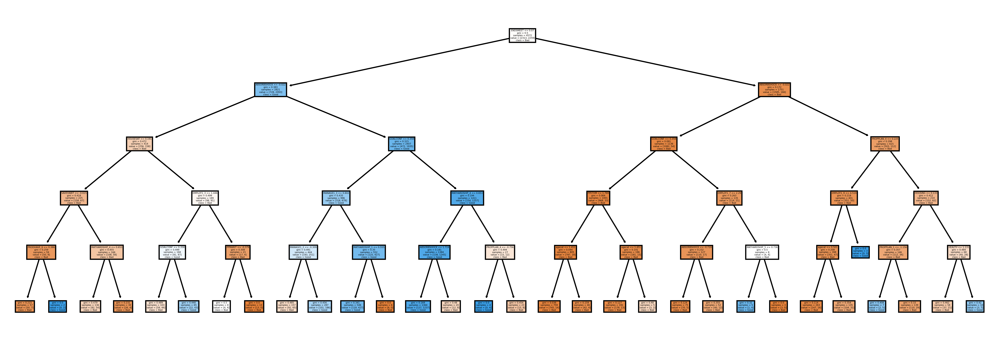

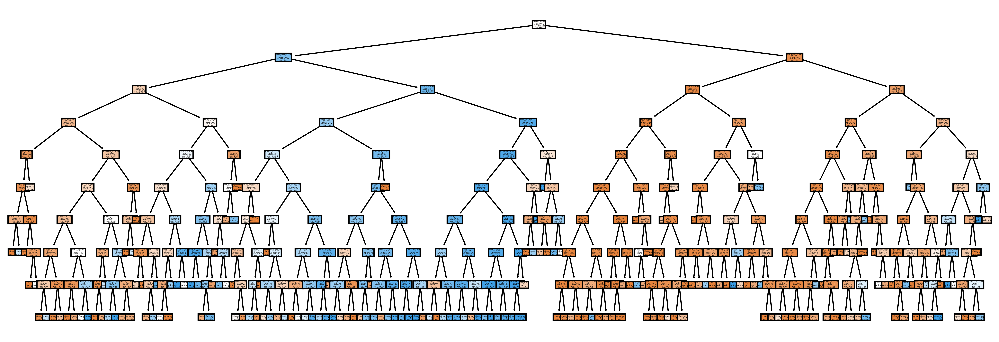

In [167]:
for i in range(0, len(model_dt2c)):
    model = model_dt2c[i] 
    
    # Configure plot
    fig, axes = plt.subplots(nrows = 1, ncols=1, figsize=(15,5), dpi=600)
    
    # Plot tree
    tree.plot_tree(model, feature_names=feature_names, class_names=class_labels, filled=True)
    
    # Save tree
    plt.savefig(f'data/d_tree_2c_{i+1}.png')

## Random Forest

In [43]:
from sklearn.ensemble import RandomForestClassifier
num_estimators = 200
# Create a random forest classifier
model_rf = RandomForestClassifier(n_estimators=num_estimators, random_state=78,
                                  max_depth=5, min_samples_split=10, min_samples_leaf=2)

In [44]:
# Fitting the model
model_rf = rf_model.fit(X_train_scaled, y_train)

C:\Users\jeffd\anaconda3\envs\dev\lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


In [45]:
# Making predictions using the testing data
predictions = model_rf.predict(X_test_scaled)

In [46]:
# Call function to evaluate the model 
eval_model_cmcr()

Confusion Matrix


,Predicted Bad,Predicted Good
Actual Bad,649,149
Actual Good,81,646


Accuracy Score : 0.8491803278688524
Classification Report
              precision    recall  f1-score   support

         Bad       0.89      0.81      0.85       798
        Good       0.81      0.89      0.85       727

    accuracy                           0.85      1525
   macro avg       0.85      0.85      0.85      1525
weighted avg       0.85      0.85      0.85      1525



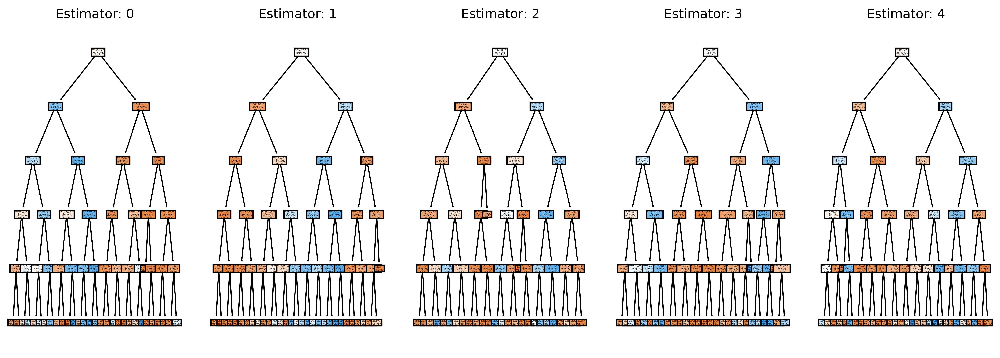

In [47]:
# Plot first 5 trees
# Code ref: https://stackoverflow.com/questions/40155128/plot-trees-for-a-random-forest-in-python-with-scikit-learn

fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(15,5), dpi=600)
for index in range(0, 5):
    tree.plot_tree(model_rf.estimators_[index],
                   feature_names = feature_names, 
                   class_names=class_labels,
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
plt.savefig('images/rf_2c_1.png')

In [30]:
# Random Forests in sklearn will automatically calculate feature importance
importances = model_rf.feature_importances_

# Sort features by their importance
sorted(zip(model_rf.feature_importances_[0:15], X.columns[0:15]), reverse=True)

[(0.015940123550960816, 'HOUSESAT'),
 (0.012160096373672439, 'PPINCIMP'),
 (0.010479119931158494, 'fpl'),
 (0.009095477064976253, 'agecat'),
 (0.008358318429465677, 'HOUSING'),
 (0.003974599172666445, 'PPMARIT'),
 (0.003630354896808697, 'HEALTH'),
 (0.0016306345168206895, 'PPEDUC'),
 (0.0013301769794579017, 'PPETHM'),
 (0.0007020629354200697, 'KIDS_2'),
 (0.0006637681016435705, 'PPREG4'),
 (0.0005387154676906475, 'KIDS_1'),
 (0.0004318869940209185, 'KIDS_3'),
 (0.0003313679501591322, 'PPGENDER'),
 (0.00030372878964277935, 'KIDS_3.1')]